<a href="https://colab.research.google.com/github/frankge777/cs521-hw4/blob/main/hw4q3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import json
from glob import glob
from skimage.segmentation import slic
from sklearn.linear_model import Ridge
import os

model = models.resnet18(pretrained=True)
model.eval()


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 202MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [3]:
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])
with open("/imagenet_class_index.json") as f:
    class_idx = json.load(f)
idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]
idx2synset = [class_idx[str(k)][0] for k in range(len(class_idx))]
id2label = {v[0]: v[1] for v in class_idx.values()}
imagenet_path = '/imagenet_samples'

# List of image file paths
image_paths = os.listdir(imagenet_path)

images = []
for img_path in image_paths:
    # Open and preprocess the image
    my_img  = os.path.join(imagenet_path, img_path)
    input_image = Image.open(my_img).convert('RGB')
    input_tensor = preprocess(input_image)
    images.append((input_tensor, input_image))
    input_batch = input_tensor.unsqueeze(0)  # Create a mini-batch as expected by the model

    # Move the input and model to GPU if available
    if torch.cuda.is_available():
        input_batch = input_batch.to('cuda')
        model.to('cuda')

    # Perform inference
    with torch.no_grad():
        output = model(input_batch)

    # Get the predicted class index
    _, predicted_idx = torch.max(output, 1)
    predicted_idx = predicted_idx.item()
    predicted_synset = idx2synset[predicted_idx]
    predicted_label = idx2label[predicted_idx]

    print(f"Predicted label: {predicted_synset} ({predicted_label})")

Predicted label: n01806143 (peacock)
Predicted label: n04118776 (rule)
Predicted label: n03250847 (drumstick)
Predicted label: n03938244 (pillow)
Predicted label: n03792782 (mountain_bike)


In [4]:
def compute_vanilla_grad(input_tensor, target_class):
  input_tensor = input_tensor.clone().detach() # leaf tensor
  input_tensor.requires_grad = True
  model.zero_grad()
  output = model(input_tensor)
  loss = output[0, target_class]
  loss.backward()
  grad = input_tensor.grad.data.abs().mean(dim=1).squeeze().cpu().numpy()
  return grad
def smooth_grad(input_tensor, target_class, stdev_spread=0.15, n_samples=50, magnitude=True):
  stdev = (stdev_spread * (input_tensor.max() - input_tensor.min())).item()
  total_gradients = np.zeros(input_tensor.shape)

  for _ in range(n_samples):
    noise = torch.normal(mean=0, std=stdev, size=input_tensor.shape, device=input_tensor.device)
    noisy_input = input_tensor + noise
    gradient = compute_vanilla_grad(noisy_input, target_class)

    if magnitude:
      total_gradients += (gradient * gradient)
    else:
      total_gradients += gradient

  avg_gradients = total_gradients / n_samples
  avg_gradients = (avg_gradients - avg_gradients.min()) / (avg_gradients.max() - avg_gradients.min())
  return avg_gradients
saliency_maps = []
for input_tensor, _ in images:
  input_batch = input_tensor.unsqueeze(0)
  if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
  saliency_map = smooth_grad(input_batch, predicted_idx)
  saliency_maps.append(saliency_map)

In [5]:
def segment_image(image_tensor, n_segments=50):
  """
  Segments an image into superpixels using SLIC.
  Handles both PyTorch Tensors and NumPy arrays.
  """
  if isinstance(image_tensor, torch.Tensor):
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()  # (H, W, C)
  elif isinstance(image_tensor, np.ndarray):
    image_np = image_tensor
  else:
    raise ValueError("Input must be a torch.Tensor or numpy.ndarray")

  segments = slic(image_np, n_segments=n_segments, compactness=10, sigma=1)
  return segments  # (H, W)
def generate_perturbations(n_superpixels, n_samples=1000):
  perturbations = np.random.randint(0, 2, (n_samples, n_superpixels))
  perturbations[0, :] = 1
  return perturbations

def apply_perturbation(input_image, segments, mask):
  perturbed_image = input_image.clone()
  segments_tensor = torch.tensor(segments, device=perturbed_image.device)
  for i in range(len(mask)):
    if mask[i] == 0:
      region_mask = (segments_tensor == i)
      region_mask = region_mask.unsqueeze(0).expand_as(perturbed_image)
      perturbed_image[region_mask] = perturbed_image[region_mask].mean()
  return perturbed_image

In [6]:
def get_predictions(input_tensor, perturbations, segments, predicted_idx):
  predictions = []
  for mask in perturbations:
    perturbed_image = apply_perturbation(input_tensor, segments, mask)
    perturbed_image = perturbed_image.unsqueeze(0).to(input_tensor.device)
    with torch.no_grad():
      output = model(perturbed_image)
    prob = torch.softmax(output, dim=1)[0, predicted_idx].item()
    predictions.append(prob)
  return np.array(predictions)
def compute_weights(perturbations, kernel_width):
  distances = np.sum(perturbations == 0, axis=1)
  weights = np.exp(-(distances**2) / kernel_width**2)
  return weights
def lime_explanation(input_tensor, model, predicted_idx, num_samples=1000, n_segments=50, kernel_width=0.25):
  image_np = input_tensor.detach().permute(1, 2, 0).cpu().numpy()
  segments = segment_image(image_np, n_segments)
  n_superpixels = np.unique(segments).shape[0]

  perturbations = generate_perturbations(n_superpixels, num_samples)
  predictions = get_predictions(input_tensor, perturbations, segments, predicted_idx)

  weights = compute_weights(perturbations, kernel_width * n_superpixels)

  clf = Ridge(alpha=1)
  clf.fit(perturbations, predictions, sample_weight=weights)

  importance_map = np.zeros_like(segments, dtype=float)
  for i in range(n_superpixels):
    importance_map[segments == i] = clf.coef_[i]

  return importance_map

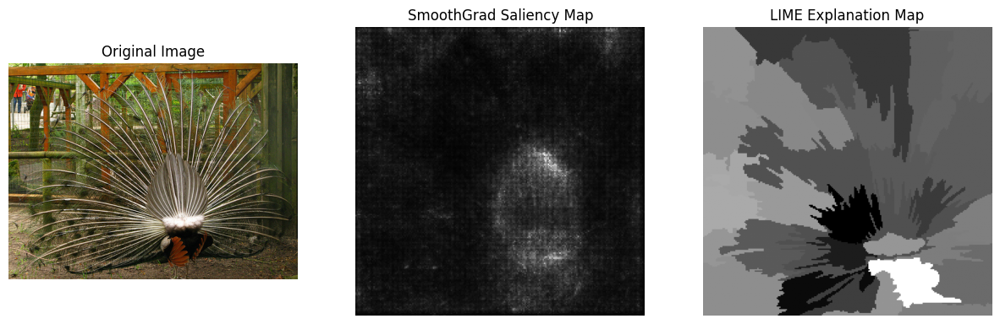

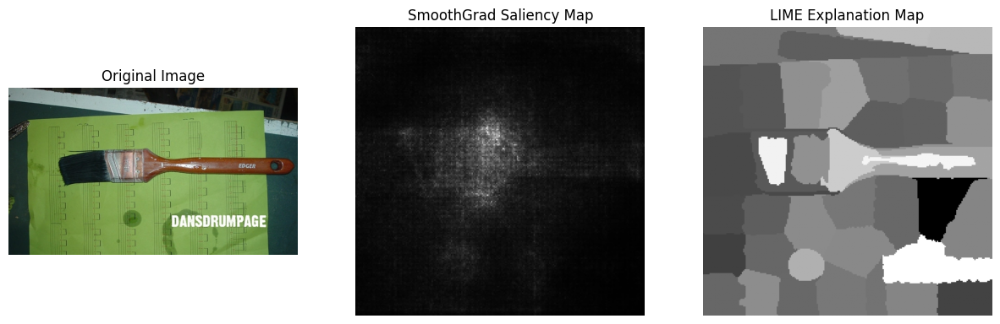

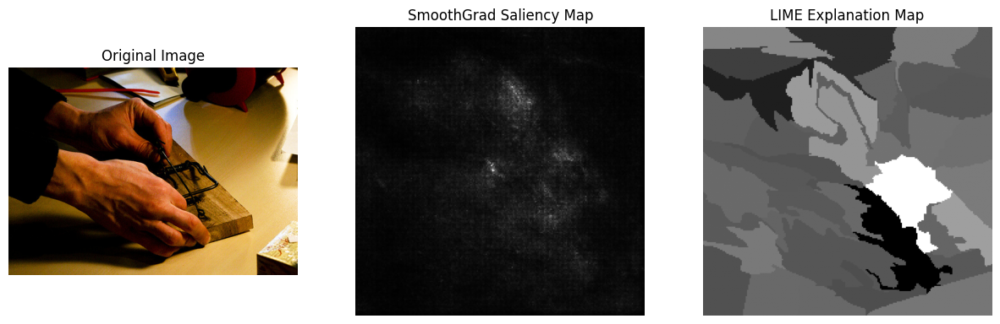

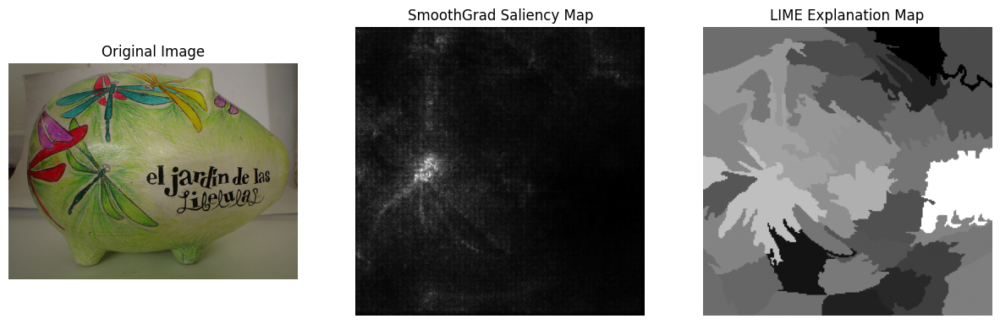

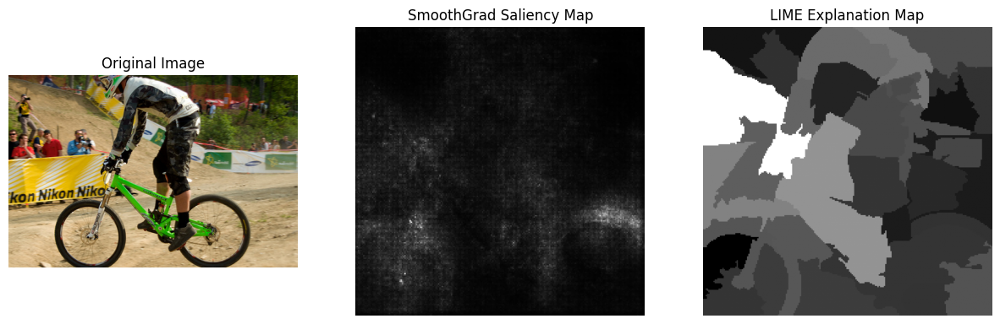

In [7]:
lime_explanations = []
for input_tensor, original_image in images:
  input_tensor = input_tensor.to(input_batch.device)
  explanation = lime_explanation(input_tensor, model, predicted_idx)
  lime_explanations.append(explanation)
def show_image(image, title=''):
  plt.imshow(image)
  plt.title(title)
  plt.axis('off')

def show_grayscale_image(image, title=''):
  plt.imshow(image, cmap='gray')
  plt.title(title)
  plt.axis('off')
def show_heatmap_image(image, title=''):
  plt.imshow(image, cmap='inferno')
  plt.title(title)
  plt.axis('off')
for idx, (input_tensor, original_image) in enumerate(images):
  plt.figure(figsize=(15, 5))

  plt.subplot(1, 3, 1)
  show_image(original_image, title='Original Image')

  plt.subplot(1, 3, 2)
  saliency = saliency_maps[idx]
  if saliency.ndim == 4:
    saliency = saliency.squeeze(0)
  if saliency.ndim == 3:
    saliency = saliency.mean(axis=0)
  saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
  show_grayscale_image(saliency, title='SmoothGrad Saliency Map')

  plt.subplot(1, 3, 3)
  lime_explanation = lime_explanations[idx]
  lime_explanation = (lime_explanation - lime_explanation.min()) / (lime_explanation.max() - lime_explanation.min())
  show_grayscale_image(lime_explanation, title='LIME Explanation Map')

  plt.show()


In [9]:
def aggregate_saliency_over_superpixels(saliency_map, segments, n_superpixels):
    if saliency_map.ndim == 4:  # (1, C, H, W)
        saliency_map = saliency_map.squeeze(0)

    if saliency_map.ndim == 3:  # (C, H, W)
        saliency_map = saliency_map.mean(axis=0)

    if saliency_map.ndim != 2:
        raise ValueError(f"Expected 2D saliency_map, got {saliency_map.ndim}D instead.")

    if saliency_map.shape != segments.shape:
        raise ValueError(f"Shape mismatch: saliency_map shape {saliency_map.shape}, segments shape {segments.shape}")

    superpixel_saliency = []
    for i in range(n_superpixels):
        mask = (segments == i)
        if mask.sum() == 0:
            superpixel_saliency.append(0.0)
        else:
            mean_saliency = saliency_map[mask].mean()
            superpixel_saliency.append(mean_saliency)
    return np.array(superpixel_saliency)
def aggregate_lime_over_superpixels(lime_map, segments, n_superpixels):
    """
    Aggregate LIME explanation values over superpixels, handling empty masks.
    """
    superpixel_lime = []
    for i in range(n_superpixels):
        mask = (segments == i)
        if mask.sum() == 0:
            superpixel_lime.append(0.0)
        else:
            mean_lime_value = lime_map[mask].mean()
            superpixel_lime.append(mean_lime_value)
    return np.array(superpixel_lime)
from scipy.stats import rankdata

def get_ranks(importances):
    return rankdata(-importances)
def kendall_tau(x, y):
    n = len(x)
    num_concordant = 0
    num_discordant = 0
    for i in range(n):
        for j in range(i+1, n):
            concordant = (x[i] - x[j]) * (y[i] - y[j]) > 0
            discordant = (x[i] - x[j]) * (y[i] - y[j]) < 0
            num_concordant += concordant
            num_discordant += discordant
    tau = (num_concordant - num_discordant) / (0.5 * n * (n - 1))
    return tau

def spearman_rank_correlation(x, y):
    n = len(x)
    diff = x - y
    diff_sq = diff**2
    rho = 1 - (6 * np.sum(diff_sq)) / (n * (n**2 - 1))
    return rho
for idx, (input_tensor, _) in enumerate(images):
    segments = segment_image(input_tensor)
    n_superpixels = np.unique(segments).shape[0]

    saliency_map = saliency_maps[idx].squeeze()
    if saliency_map.ndim == 3 and saliency_map.shape[0] == 3:
        saliency_map = np.mean(saliency_map, axis=0)
    assert saliency_map.shape == segments.shape, f"Shape mismatch: {saliency_map.shape} vs {segments.shape}"

    superpixel_saliency = aggregate_saliency_over_superpixels(saliency_map, segments, n_superpixels)

    lime_map = lime_explanations[idx]
    assert lime_map.shape == segments.shape, f"Shape mismatch: {lime_map.shape} vs {segments.shape}"
    superpixel_lime = aggregate_lime_over_superpixels(lime_map, segments, n_superpixels)
    ranks_lime = get_ranks(superpixel_lime)
    ranks_smoothgrad = get_ranks(superpixel_saliency)
    tau = kendall_tau(ranks_lime, ranks_smoothgrad)
    rho = spearman_rank_correlation(ranks_lime, ranks_smoothgrad)

    print(f"Image {idx+1}:")
    print(f"Kendall-Tau correlation: {tau}")
    print(f"Spearman Rank correlation: {rho}")
    print()

Image 1:
Kendall-Tau correlation: -0.11363636363636363
Spearman Rank correlation: -0.1788101604278074

Image 2:
Kendall-Tau correlation: 0.14634146341463414
Spearman Rank correlation: 0.22996515679442509

Image 3:
Kendall-Tau correlation: 0.05405405405405406
Spearman Rank correlation: 0.08274063537221432

Image 4:
Kendall-Tau correlation: 0.1794871794871795
Spearman Rank correlation: 0.26093117408906885

Image 5:
Kendall-Tau correlation: 0.08387096774193549
Spearman Rank correlation: 0.09556451612903227



In [10]:
def lime_explanation(input_tensor, model, predicted_idx, segments, num_samples=1000, kernel_width=0.25):
    # edited LIME explanation map fn using precomputed superpixel segments.
    n_superpixels = np.unique(segments).shape[0]

    perturbations = generate_perturbations(n_superpixels, num_samples)
    predictions = get_predictions(input_tensor, perturbations, segments, predicted_idx)

    weights = compute_weights(perturbations, kernel_width * n_superpixels)

    clf = Ridge(alpha=1)
    clf.fit(perturbations, predictions, sample_weight=weights)

    importance_map = np.zeros_like(segments, dtype=float)
    for i in range(n_superpixels):
        importance_map[segments == i] = clf.coef_[i]

    return importance_map
def pgd_loss(input_tensor, perturbed_tensor, target_class, saliency_map, lime_explanation_map, segments, weight_saliency=0.5, weight_pred=0.5):

    pred_loss = torch.nn.functional.cross_entropy(
        model(perturbed_tensor),
        torch.tensor([target_class]).to(input_tensor.device)
    )

    perturbed_saliency = smooth_grad(perturbed_tensor, target_class)

    perturbed_lime_map = lime_explanation(perturbed_tensor.squeeze(0), model, target_class, segments)

    saliency_diff = ((saliency_map - perturbed_saliency) ** 2).mean()
    lime_diff = ((lime_explanation_map - perturbed_lime_map) ** 2).mean()

    explanation_loss = saliency_diff + lime_diff
    total_loss = weight_pred * pred_loss - weight_saliency * explanation_loss
    return total_loss

def pgd_attack(input_tensor, target_class, saliency_map, lime_map, segments, epsilon, alpha=0.01, steps=5):
    perturbed_tensor = input_tensor.clone().detach().requires_grad_(True)

    for _ in range(steps):
        loss = pgd_loss(input_tensor, perturbed_tensor, target_class, saliency_map, lime_map, segments)
        loss.backward()

        perturbed_tensor = perturbed_tensor + alpha * perturbed_tensor.grad.sign()
        perturbed_tensor = torch.clamp(perturbed_tensor, input_tensor - epsilon, input_tensor + epsilon).detach().requires_grad_(True)

    return perturbed_tensor




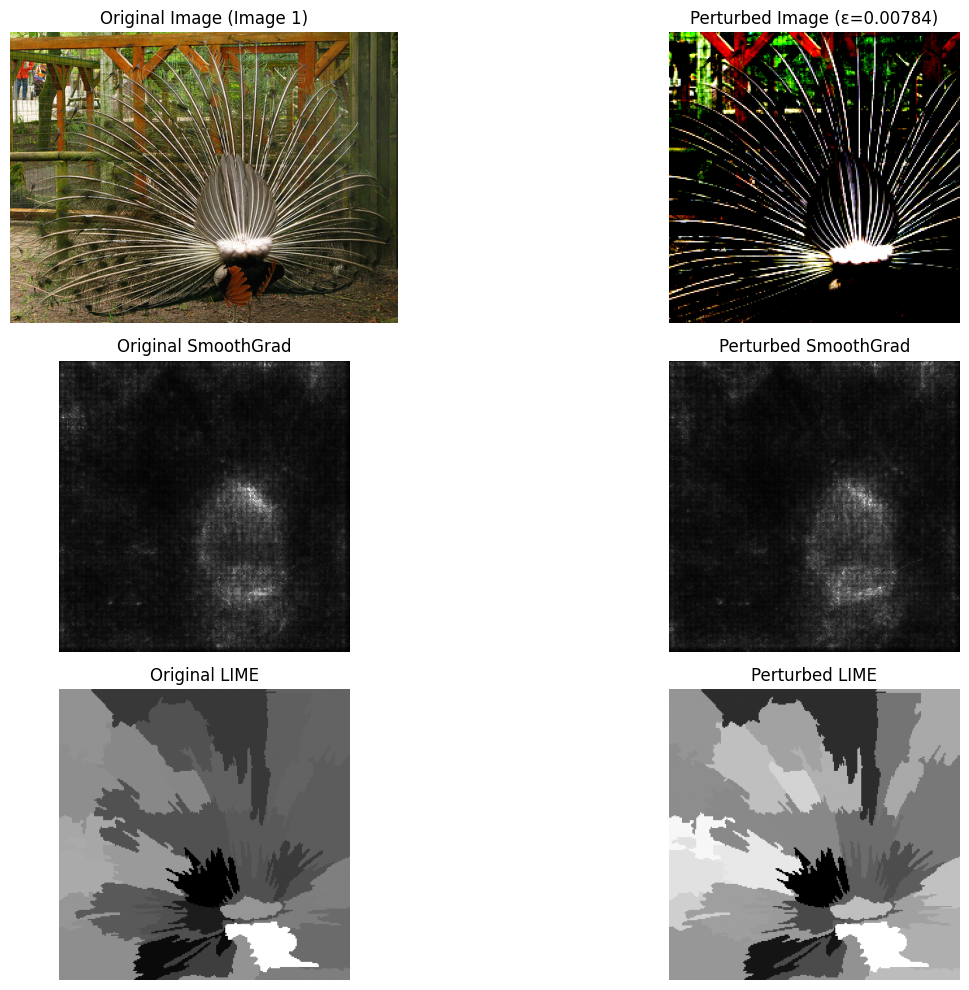

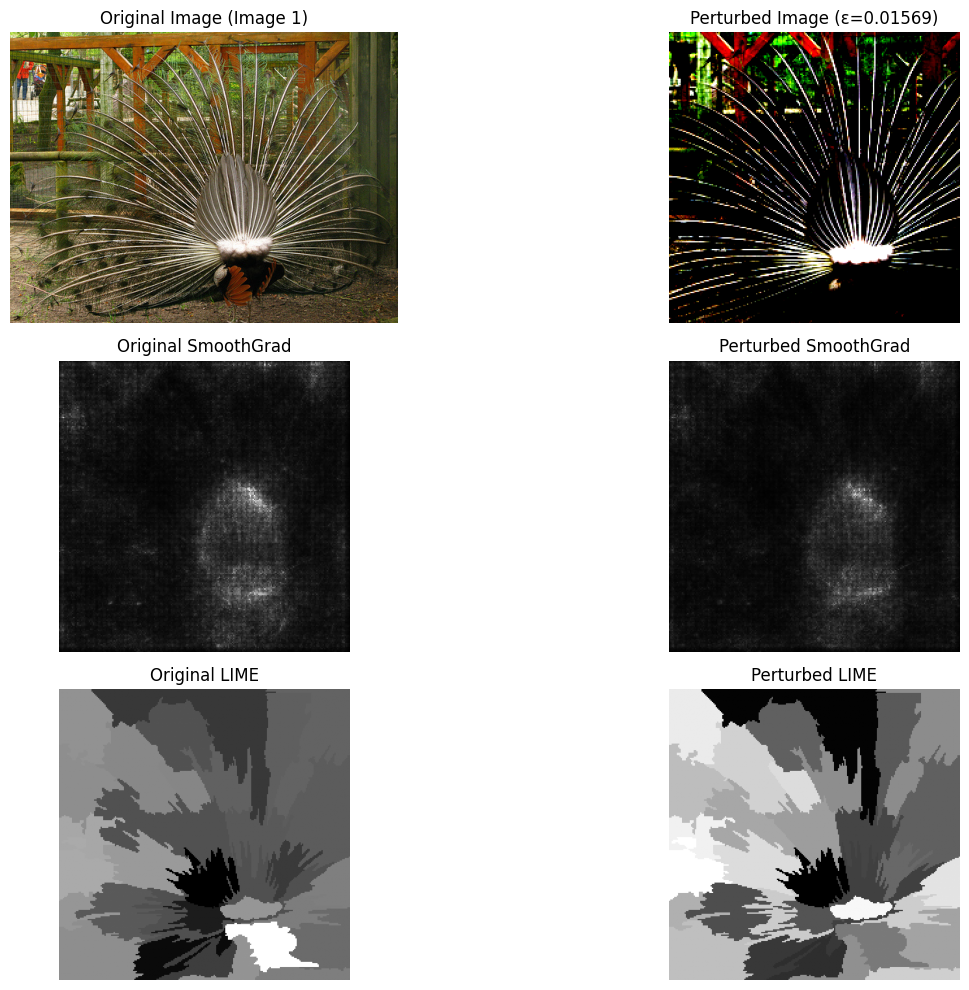

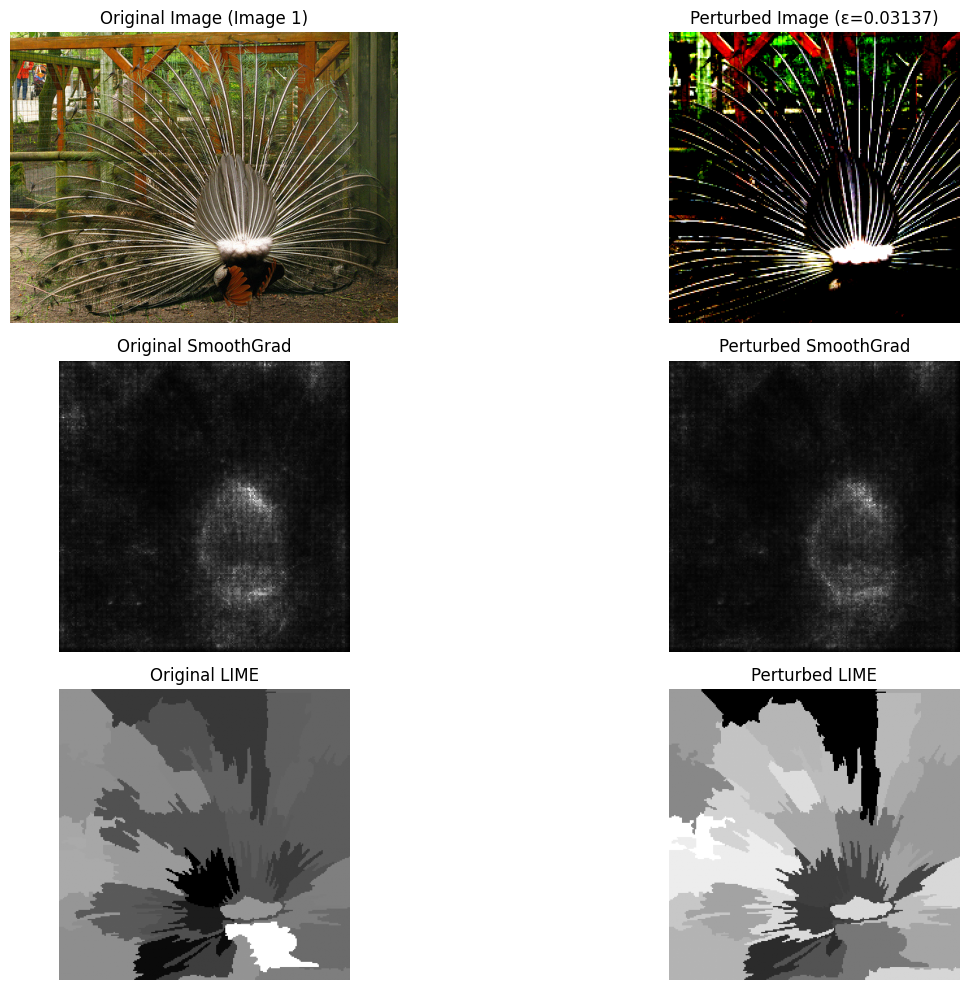

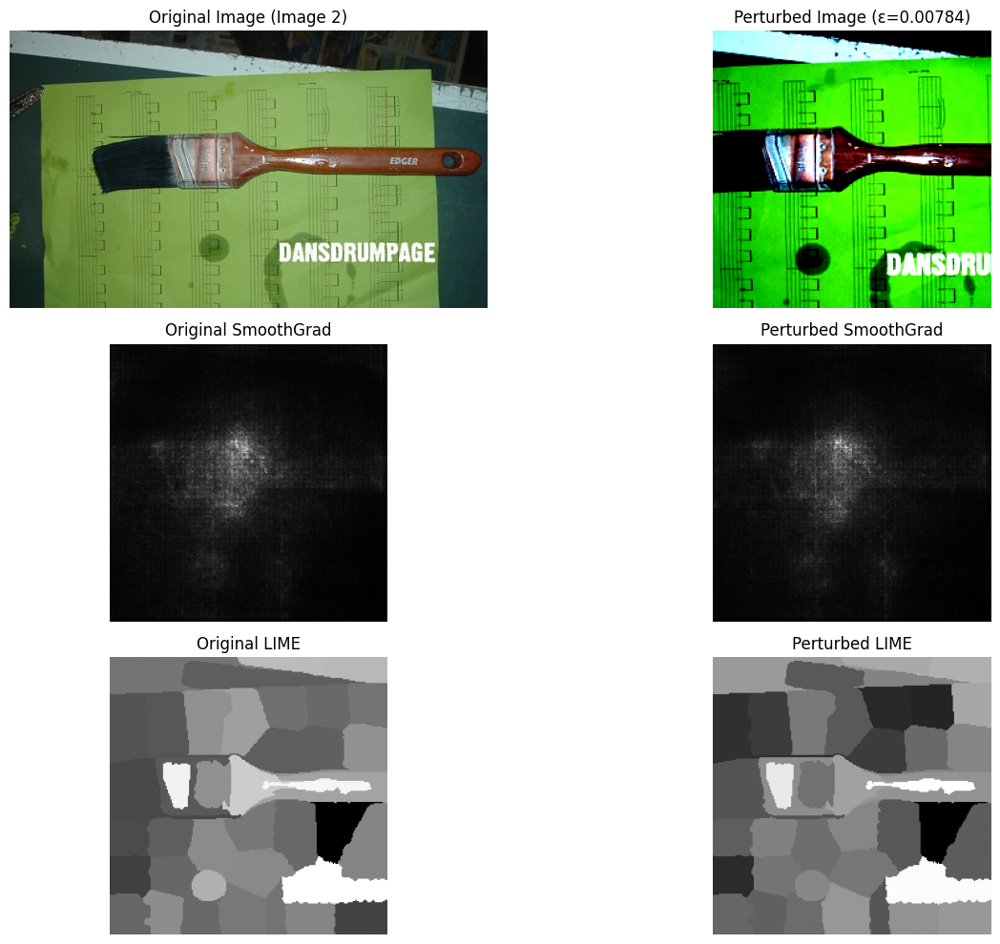

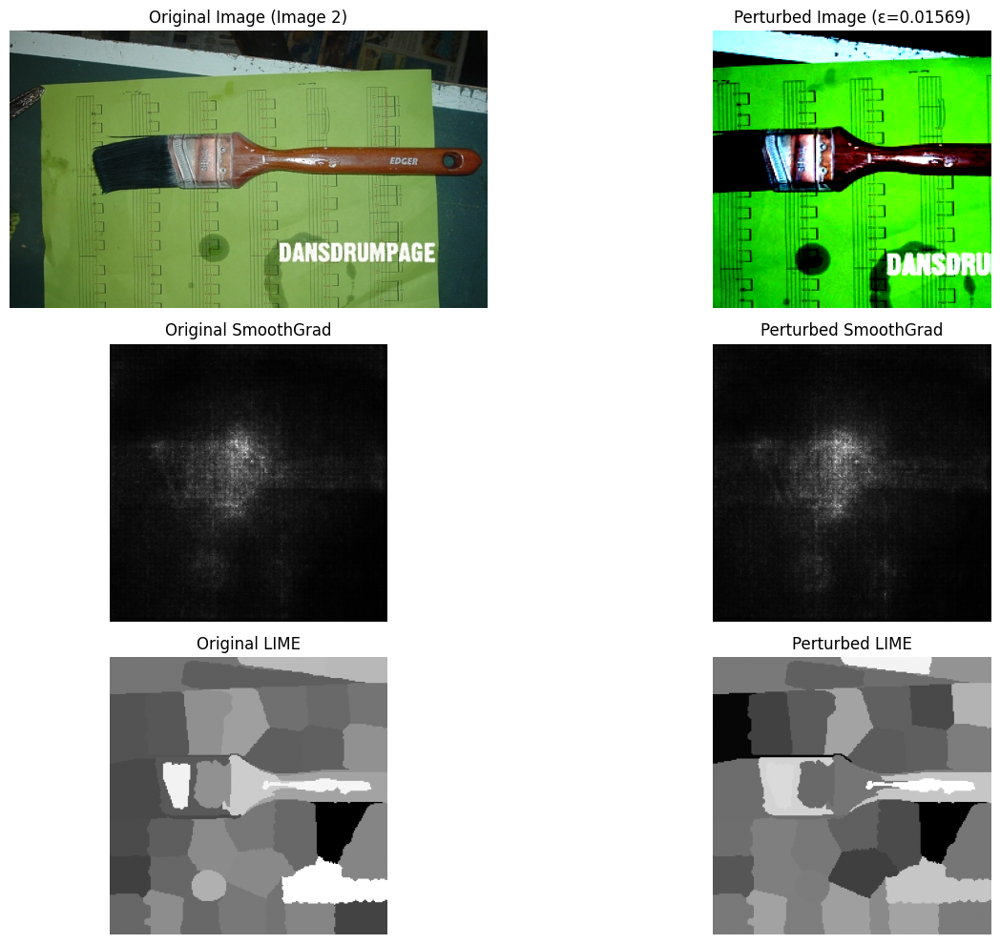

...

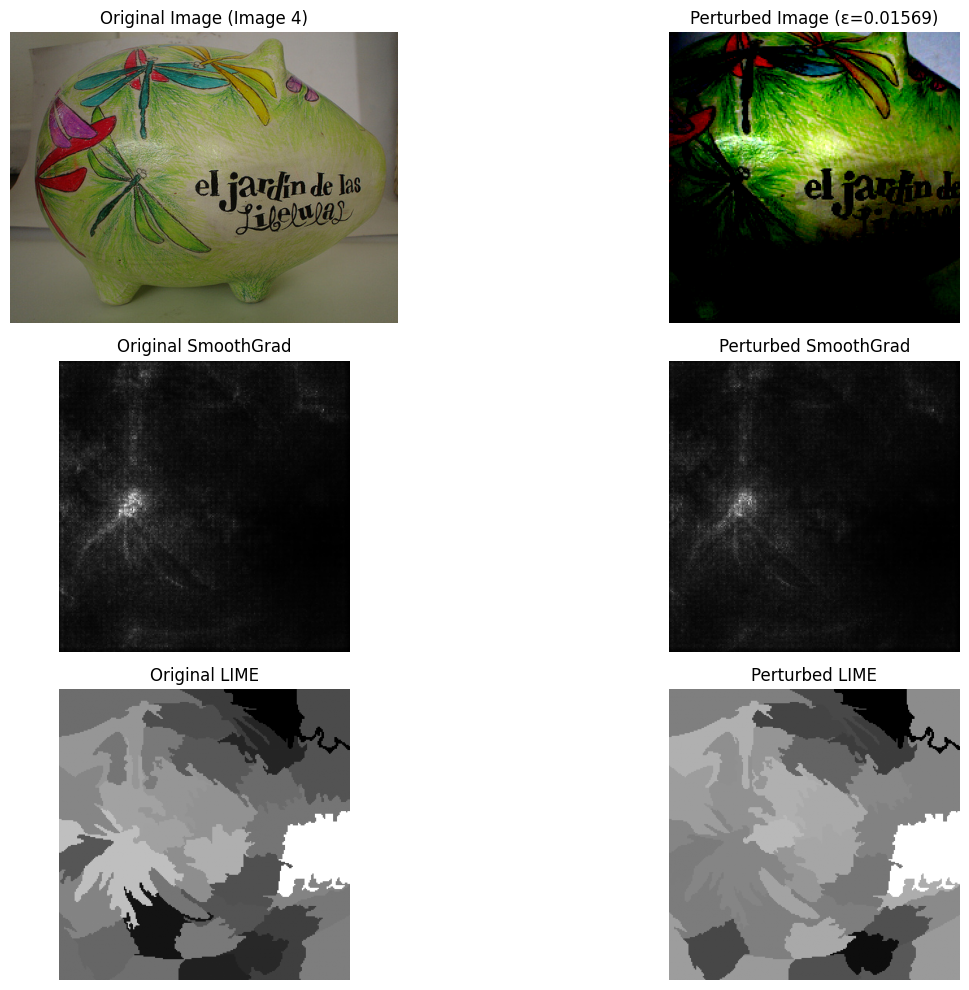

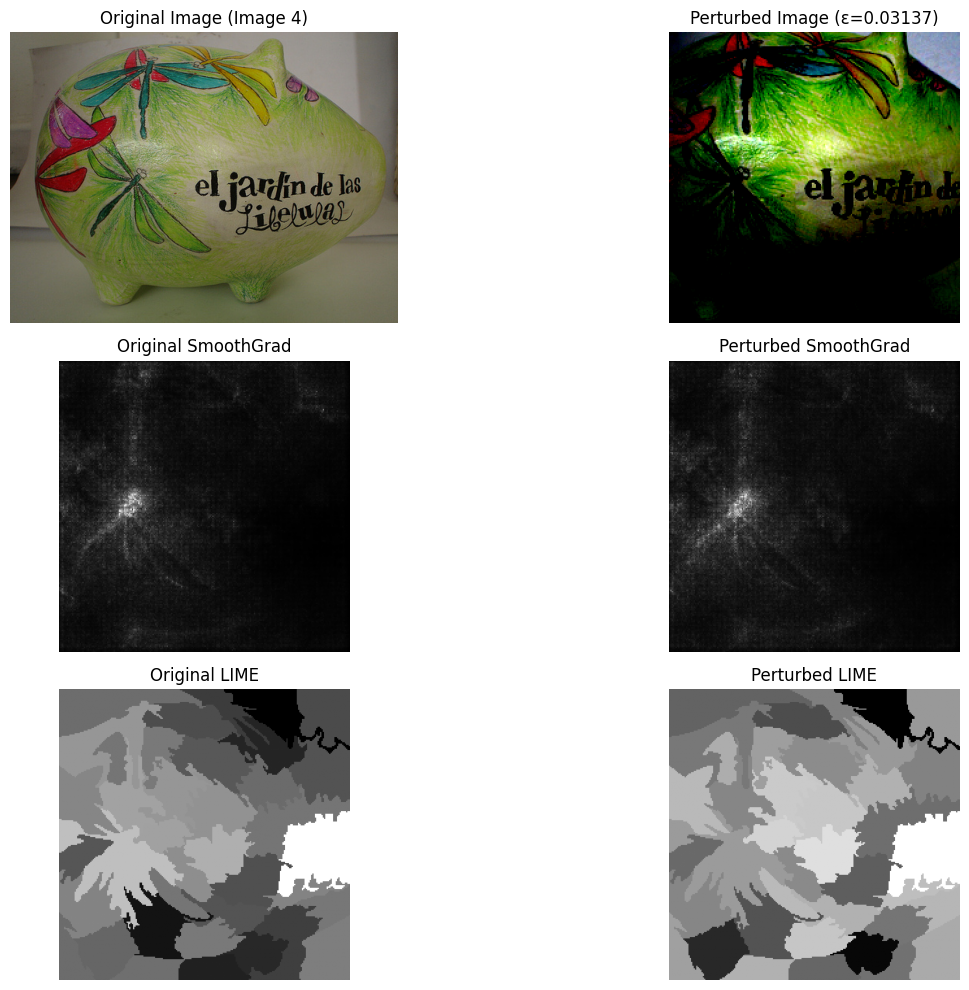

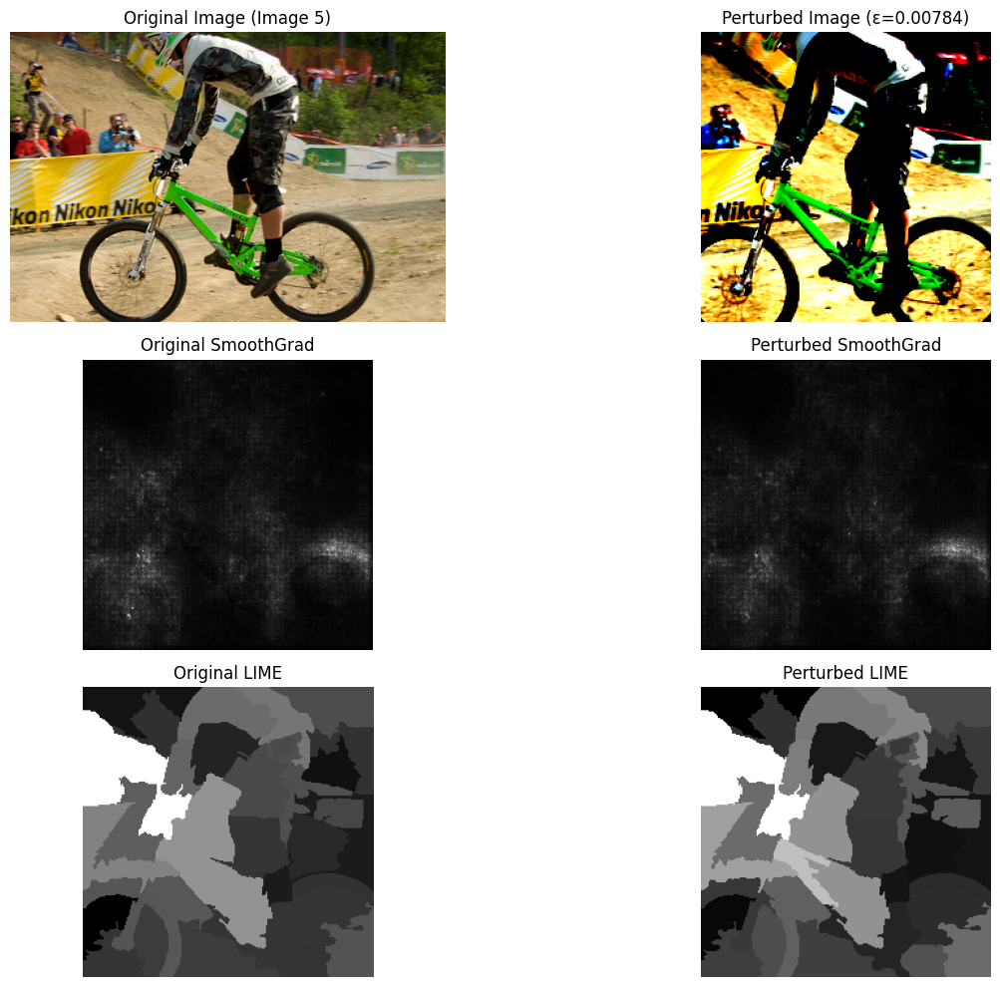

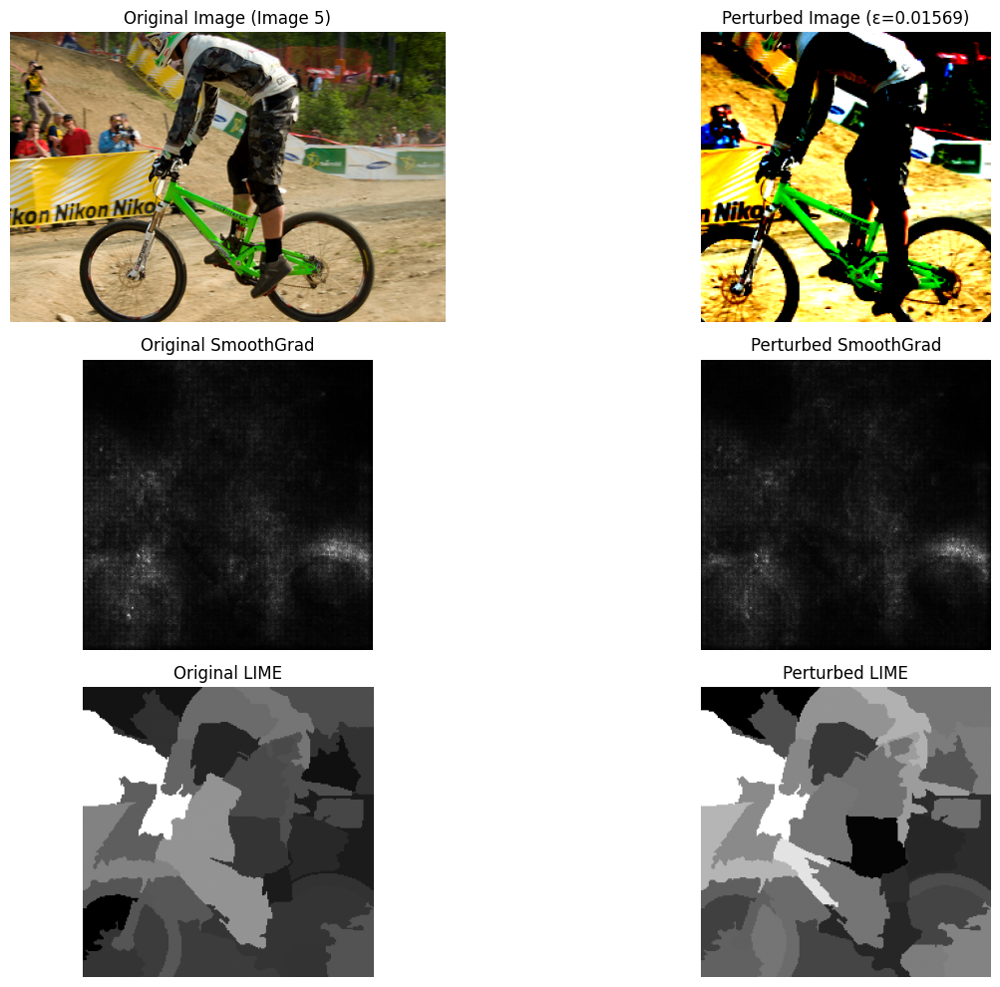

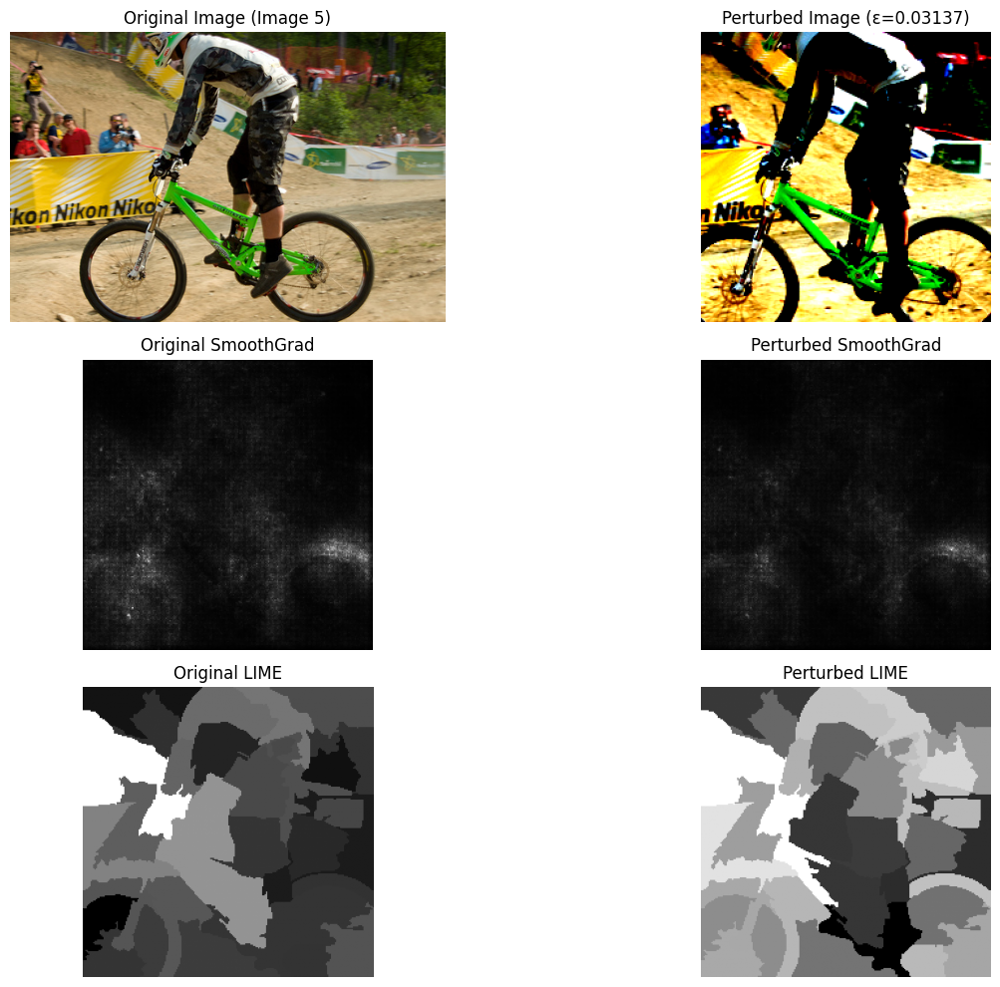

In [11]:
for idx, (input_tensor, original_image) in enumerate(images):
    input_tensor = input_tensor.unsqueeze(0).to(input_batch.device)
    saliency_map = saliency_maps[idx]
    lime_explanation_map = lime_explanations[idx]

    segments = segment_image(input_tensor.squeeze(0))

    for epsilon in [2/255, 4/255, 8/255]:
        perturbed_tensor = pgd_attack(input_tensor, predicted_idx, saliency_map, lime_explanation_map, segments, epsilon)
        perturbed_tensor = perturbed_tensor.squeeze(0)
        perturbed_saliency = smooth_grad(perturbed_tensor.unsqueeze(0), predicted_idx)
        perturbed_lime_map = lime_explanation(perturbed_tensor, model, predicted_idx, segments)

        plt.figure(figsize=(15, 10))

        plt.subplot(3, 2, 1)
        show_image(original_image, title=f"Original Image (Image {idx+1})")
        plt.subplot(3, 2, 3)
        show_grayscale_image(saliency_map.squeeze(0).mean(axis=0), title="Original SmoothGrad")
        plt.subplot(3, 2, 5)
        show_grayscale_image(lime_explanation_map, title="Original LIME")

        perturbed_image = perturbed_tensor.detach().permute(1, 2, 0).cpu().numpy()
        plt.subplot(3, 2, 2)
        show_image(perturbed_image, title=f"Perturbed Image (ε={epsilon:.5f})")
        plt.subplot(3, 2, 4)
        show_grayscale_image(perturbed_saliency.squeeze(0).mean(axis=0), title="Perturbed SmoothGrad")
        plt.subplot(3, 2, 6)
        show_grayscale_image(perturbed_lime_map, title="Perturbed LIME")


        plt.tight_layout()
        plt.show()

In [12]:
for idx, (input_tensor, original_image) in enumerate(images):
    segments = segment_image(input_tensor.squeeze(0))
    n_superpixels = np.unique(segments).shape[0]

    ranks_original_saliency = get_ranks(aggregate_saliency_over_superpixels(saliency_map, segments, n_superpixels))
    ranks_perturbed_saliency = get_ranks(aggregate_saliency_over_superpixels(perturbed_saliency, segments, n_superpixels))
    tau_saliency = kendall_tau(ranks_original_saliency, ranks_perturbed_saliency)
    rho_saliency = spearman_rank_correlation(ranks_original_saliency, ranks_perturbed_saliency)

    ranks_original_lime = get_ranks(aggregate_lime_over_superpixels(lime_map, segments, n_superpixels))
    ranks_perturbed_lime = get_ranks(aggregate_lime_over_superpixels(perturbed_lime_map, segments, n_superpixels))
    tau_lime = kendall_tau(ranks_original_lime, ranks_perturbed_lime)
    rho_lime = spearman_rank_correlation(ranks_original_lime, ranks_perturbed_lime)

    print(f"Image {idx+1}, Epsilon {epsilon}:")
    print(f"Kendall-Tau (Saliency): {tau_saliency}, Spearman: {rho_saliency}")
    print(f"Kendall-Tau (LIME): {tau_lime}, Spearman: {rho_lime}")

Image 1, Epsilon 0.03137254901960784:
Kendall-Tau (Saliency): 0.9015151515151515, Spearman: 0.981951871657754
Kendall-Tau (LIME): 0.16287878787878787, Spearman: 0.2536764705882353
Image 2, Epsilon 0.03137254901960784:
Kendall-Tau (Saliency): 0.9195121951219513, Spearman: 0.9862369337979094
Kendall-Tau (LIME): 0.25365853658536586, Spearman: 0.32055749128919864
Image 3, Epsilon 0.03137254901960784:
Kendall-Tau (Saliency): 0.9429429429429429, Spearman: 0.9881460407776197
Kendall-Tau (LIME): 0.23123123123123124, Spearman: 0.3259838786154575
Image 4, Epsilon 0.03137254901960784:
Kendall-Tau (Saliency): 0.9406207827260459, Spearman: 0.9919028340080972
Kendall-Tau (LIME): 0.16869095816464239, Spearman: 0.244331983805668
Image 5, Epsilon 0.03137254901960784:
Kendall-Tau (Saliency): 0.9182795698924732, Spearman: 0.9850806451612903
Kendall-Tau (LIME): 0.38064516129032255, Spearman: 0.46612903225806457
